In [1]:
# Import necessary modules
import cv2           
import numpy as np   
import tensorflow as tf
from mtcnn import MTCNN
import matplotlib.pyplot as plt

In [2]:
#emotion recognition model
emotion_recognition_model = tf.keras.models.load_model('../models/CNN_emotion_detection.keras')
mtcnn_detector = MTCNN()

c:\Users\MSI\anaconda3\Lib\site-packages\keras\src\saving\saving_lib.py:802: UserWarning: Skipping variable loading for optimizer 'rmsprop', because it has 10 variables whereas the saved optimizer has 18 variables. 
  saveable.load_own_variables(weights_store.get(inner_path))


In [3]:
def faces_detection(image_path):
    """
    Detect faces using MTCNN (Multi-task Cascaded Convolutional Networks)
    Very accurate for face detection
    """
    
    # Load image
    image = cv2.imread(image_path)
    if image is None:
        print(f"Error: Could not load image at {image_path}")
        return
    
    image_rgb = cv2.cvtColor(image, cv2.COLOR_BGR2RGB)
    
    # Detect faces
    faces = mtcnn_detector.detect_faces(image_rgb)
    print(f"Found {len(faces)} face(s) with MTCNN")
    
    # Draw rectangles
    for face in faces:
        x, y, w, h = face['box']
        confidence = face['confidence']
        
        # Draw rectangle
        cv2.rectangle(image, (x, y), (x + w, y + h), (255, 255, 255), 2)
        
        # Draw confidence score
        cv2.putText(image, f'{confidence:.2f}', (x, y-10), 
                   cv2.FONT_HERSHEY_SIMPLEX, 0.5, (255, 255, 255), 2)
        
        # Draw facial landmarks (eyes, nose, mouth)
        for key, point in face['keypoints'].items():
            cv2.circle(image, point, 2, (0, 255, 0), 2)
    
    # Display
    plt.figure(figsize=(20, 20))
    plt.imshow(cv2.cvtColor(image, cv2.COLOR_BGR2RGB))
    plt.axis('off')
    plt.show()

In [4]:
def face_emotion(image_path):
    """
    Extract faces using MTCNN and predict emotions
    """

    # Load image
    image = cv2.imread(image_path)
    if image is None:
        print(f"Error: Could not load image at {image_path}")
        return
    
    image_rgb = cv2.cvtColor(image, cv2.COLOR_BGR2RGB)
    
    # Detect faces
    faces = mtcnn_detector.detect_faces(image_rgb)
    print(f"Processing {len(faces)} face(s) for emotion recognition")
    
    for idx, face in enumerate(faces):
        x, y, w, h = face['box']
        confidence = face['confidence']
        
        # Extract face region
        face_region = image_rgb[y:y+h, x:x+w]
        
        # Resize to 48x48 for emotion model
        resized_face = cv2.resize(face_region, (48, 48))
        preprocessed_face = np.expand_dims(resized_face, axis=0) / 255.0
        
        # Display face
        plt.figure(figsize=(3, 3))
        plt.imshow(resized_face)
        plt.title(f"Face {idx + 1} (conf: {confidence:.2f})")
        plt.axis('off')
        plt.show()
        
        # Predict emotion
        prob_sad = emotion_recognition_model.predict(preprocessed_face, verbose=0)[0][0]
        print(f'Face {idx + 1} - Probability of being sad: {prob_sad:.4f}')

Found 7 face(s) with MTCNN


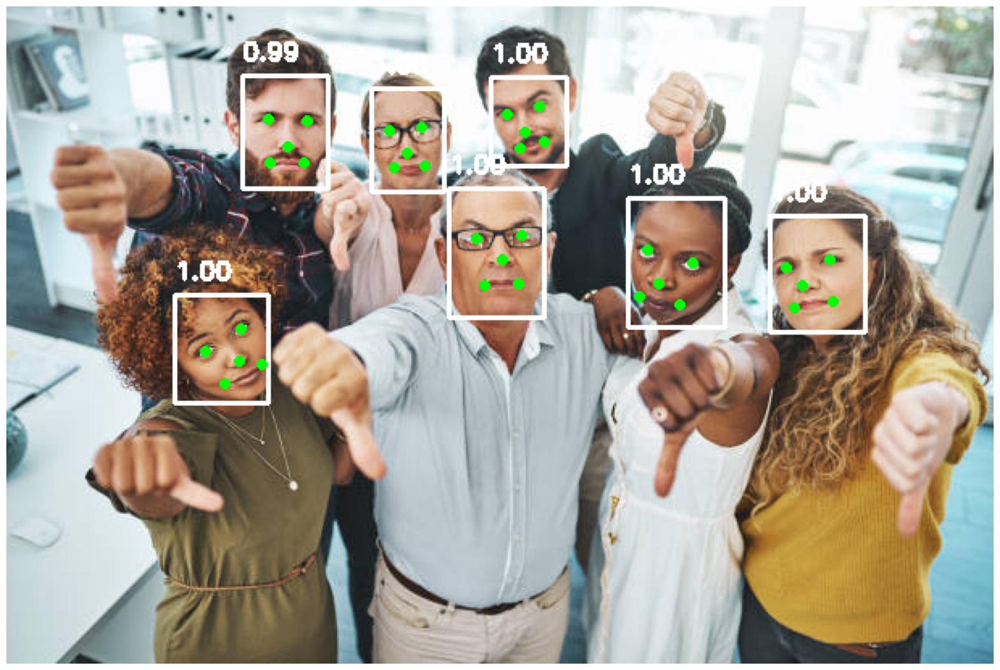

In [5]:
faces_detection('../assets/istockphoto-1141421597-612x612.jpg')

Processing 7 face(s) for emotion recognition


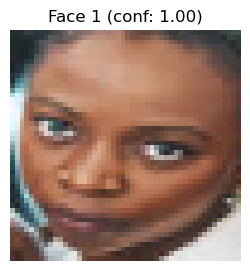

Face 1 - Probability of being sad: 0.7840


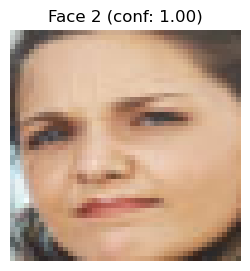

Face 2 - Probability of being sad: 0.9127


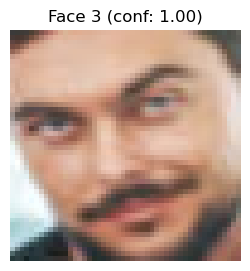

Face 3 - Probability of being sad: 0.2596


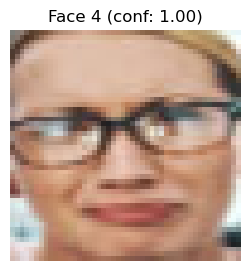

Face 4 - Probability of being sad: 0.6666


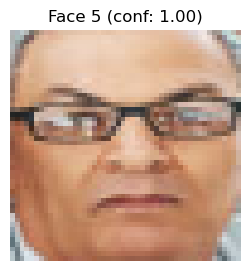

Face 5 - Probability of being sad: 0.9996


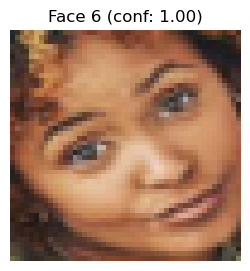

Face 6 - Probability of being sad: 0.0513


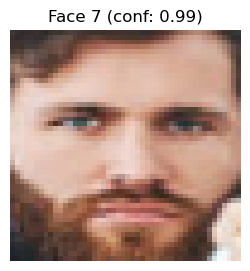

Face 7 - Probability of being sad: 0.9926


In [6]:
face_emotion('../assets/istockphoto-1141421597-612x612.jpg')

Found 18 face(s) with MTCNN


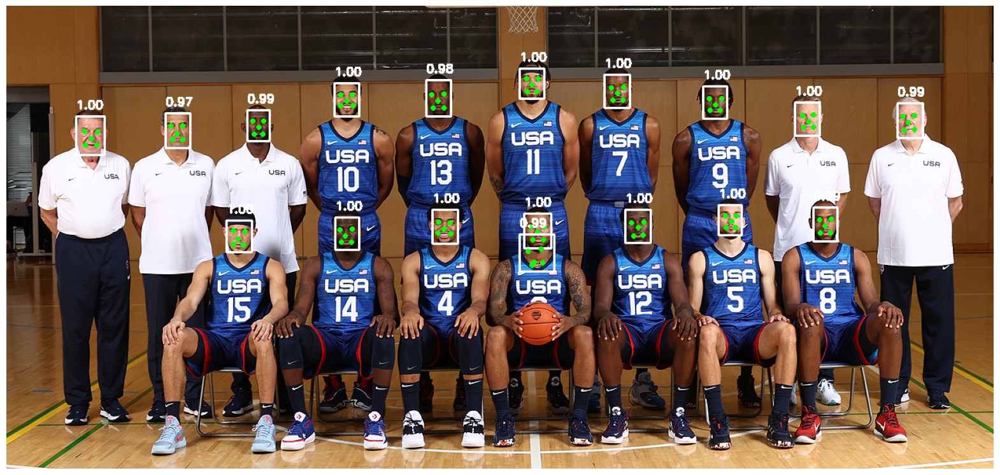

In [7]:
faces_detection('../assets/basket.jpg')

Processing 18 face(s) for emotion recognition


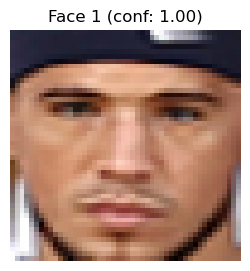

Face 1 - Probability of being sad: 0.9900


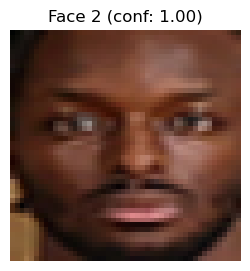

Face 2 - Probability of being sad: 0.9124


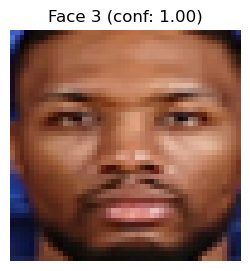

Face 3 - Probability of being sad: 0.6341


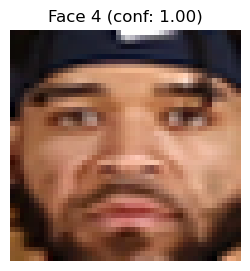

Face 4 - Probability of being sad: 0.9821


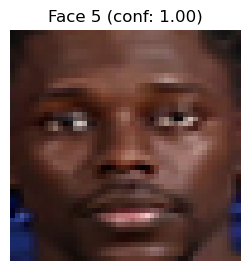

Face 5 - Probability of being sad: 0.8249


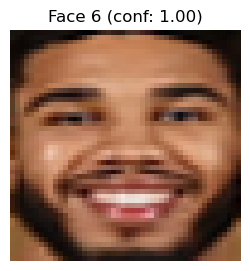

Face 6 - Probability of being sad: 0.0005


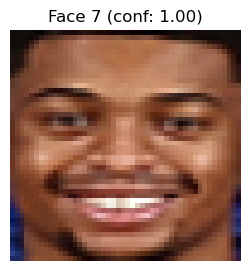

Face 7 - Probability of being sad: 0.0015


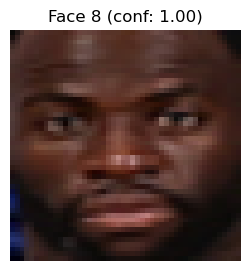

Face 8 - Probability of being sad: 0.8869


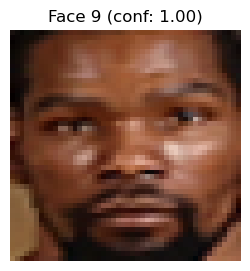

Face 9 - Probability of being sad: 0.9606


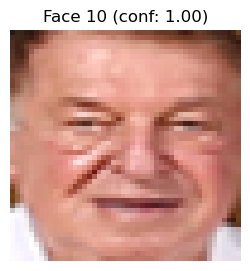

Face 10 - Probability of being sad: 0.3682


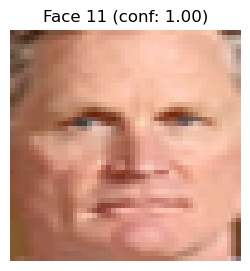

Face 11 - Probability of being sad: 0.1859


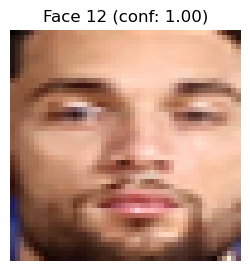

Face 12 - Probability of being sad: 0.9555


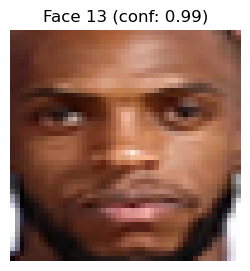

Face 13 - Probability of being sad: 0.9665


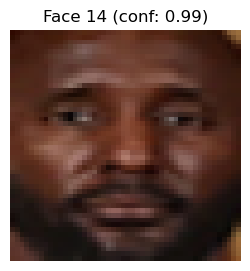

Face 14 - Probability of being sad: 0.9343


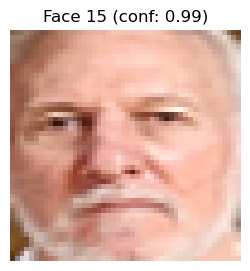

Face 15 - Probability of being sad: 0.9888


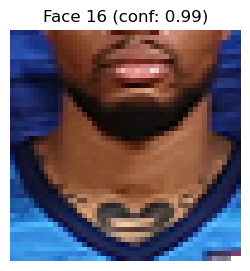

Face 16 - Probability of being sad: 0.7375


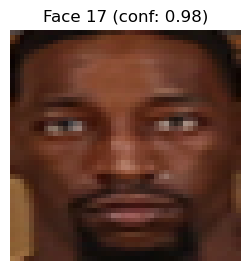

Face 17 - Probability of being sad: 0.8979


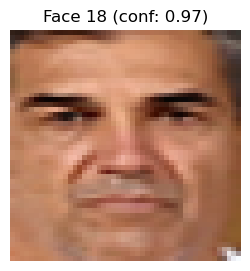

Face 18 - Probability of being sad: 0.9007


In [8]:
face_emotion('../assets/basket.jpg')

Found 15 face(s) with MTCNN


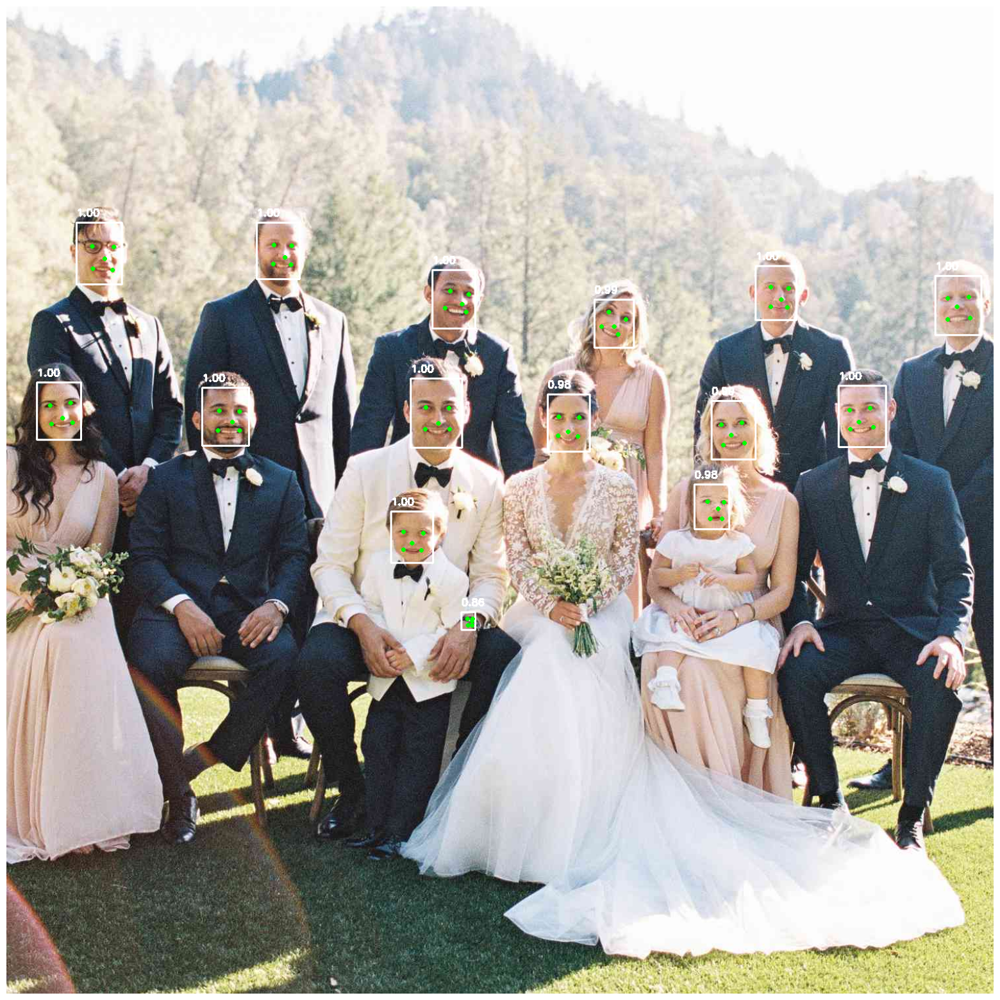

In [9]:
faces_detection('../assets/party.jpg')

Processing 15 face(s) for emotion recognition


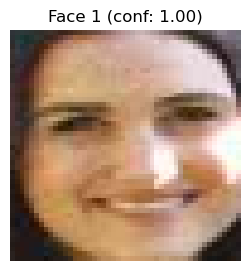

Face 1 - Probability of being sad: 0.0327


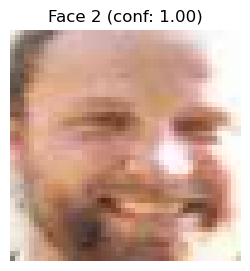

Face 2 - Probability of being sad: 0.0829


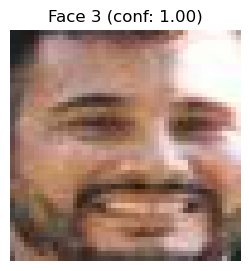

Face 3 - Probability of being sad: 0.0298


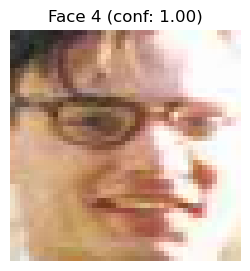

Face 4 - Probability of being sad: 0.1022


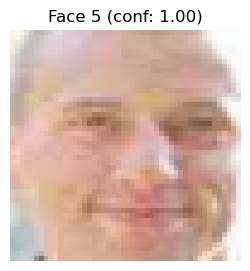

Face 5 - Probability of being sad: 0.6745


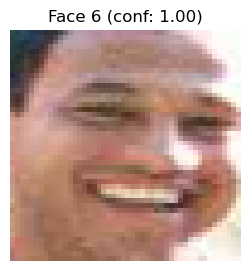

Face 6 - Probability of being sad: 0.0012


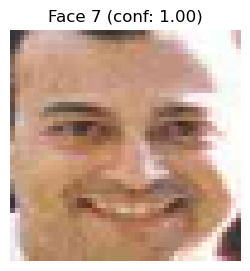

Face 7 - Probability of being sad: 0.0074


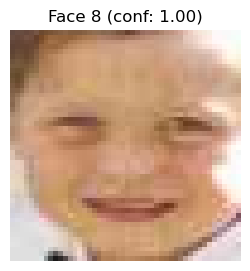

Face 8 - Probability of being sad: 0.1090


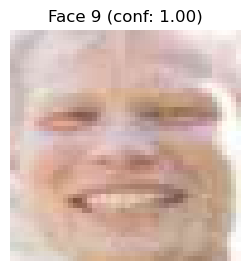

Face 9 - Probability of being sad: 0.1643


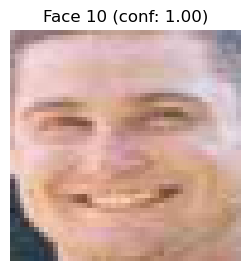

Face 10 - Probability of being sad: 0.0025


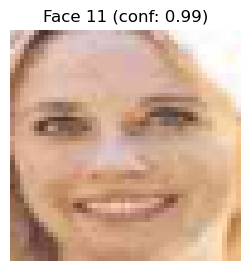

Face 11 - Probability of being sad: 0.0042


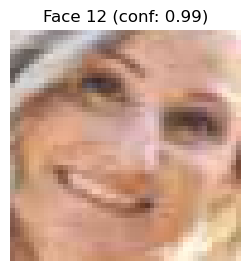

Face 12 - Probability of being sad: 0.0200


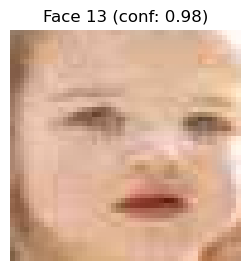

Face 13 - Probability of being sad: 0.9729


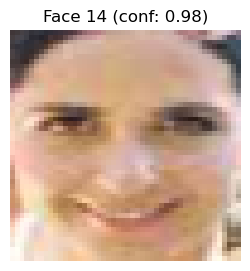

Face 14 - Probability of being sad: 0.0357


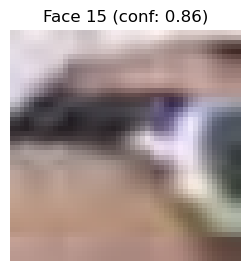

Face 15 - Probability of being sad: 0.9485


In [10]:
face_emotion('../assets/party.jpg')

Found 7 face(s) with MTCNN


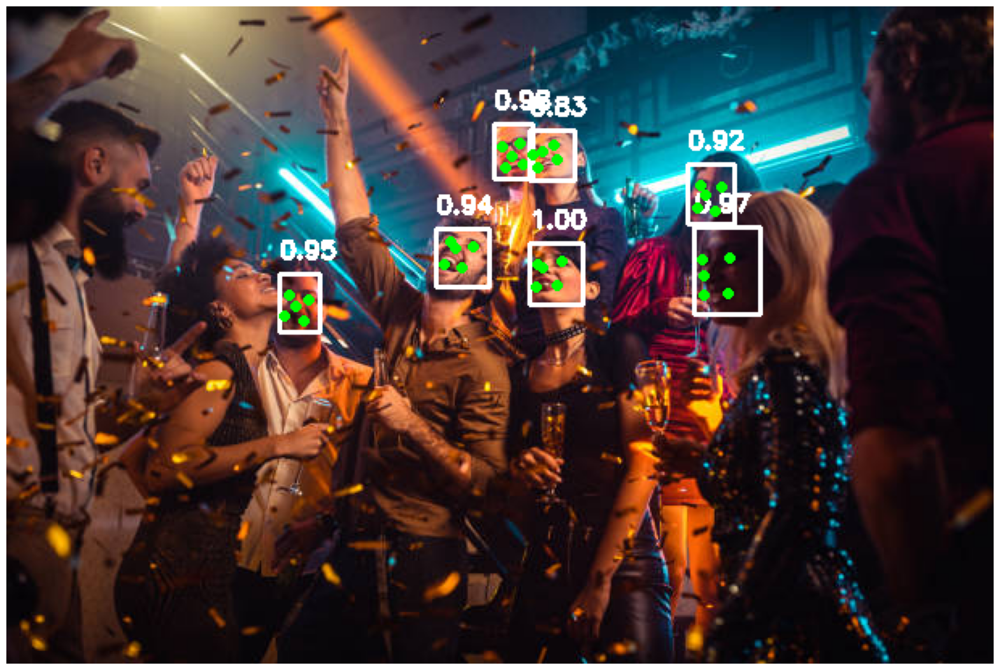

In [11]:
faces_detection('../assets/party2.jpg')

Processing 7 face(s) for emotion recognition


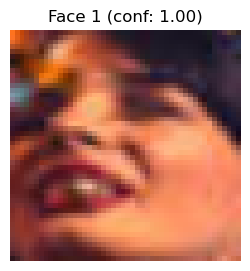

Face 1 - Probability of being sad: 0.9201


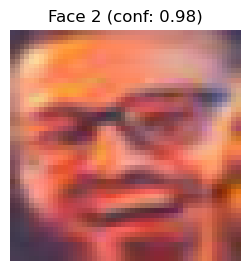

Face 2 - Probability of being sad: 0.5427


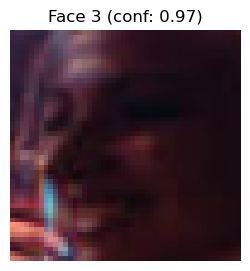

Face 3 - Probability of being sad: 0.5799


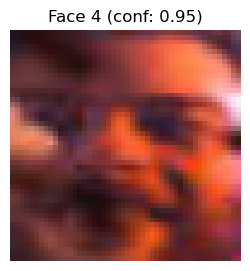

Face 4 - Probability of being sad: 0.4819


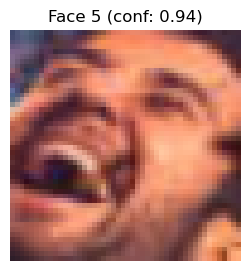

Face 5 - Probability of being sad: 0.6846


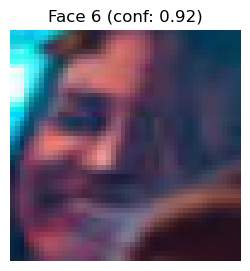

Face 6 - Probability of being sad: 0.8430


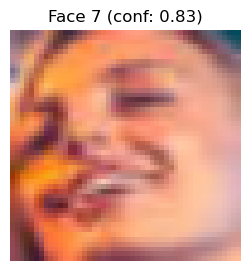

Face 7 - Probability of being sad: 0.8015


In [12]:
face_emotion('../assets/party2.jpg')